In [65]:
#!pip install -e ../../


In [10]:
# Copyright (c) 2020 Akihiro Nitta
# All rights reserved.

from __future__ import print_function, division
import os
from torchvision.datasets.vision import VisionDataset
from PIL import Image
from collections import defaultdict
import logging
import json
import collections
import torch
import math


# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

LABEL_TO_STRING = {
    11: "Fixed-wing Aircraft",
    12: "Small Aircraft",
    13: "Passenger/Cargo Plane",
    15: "Helicopter",
    17: "Passenger Vehicle",
    18: "Small Car",
    19: "Bus",
    20: "Pickup Truck",
    21: "Utility Truck",
    23: "Truck",
    24: "Cargo Truck",
    25: "Truck Tractor w/ Box Trailer",
    26: "Truck Tractor",
    27: "Trailer",
    28: "Truck Tractor w/ Flatbed Trailer",
    29: "Truck Tractor w/ Liquid Tank",
    32: "Crane Truck",
    33: "Railway Vehicle",
    34: "Passenger Car",
    35: "Cargo/Container Car",
    36: "Flat Car",
    37: "Tank car",
    38: "Locomotive",
    40: "Maritime Vessel",
    41: "Motorboat",
    42: "Sailboat",
    44: "Tugboat",
    45: "Barge",
    47: "Fishing Vessel",
    49: "Ferry",
    50: "Yacht",
    51: "Container Ship",
    52: "Oil Tanker",
    53: "Engineering Vehicle",
    54: "Tower crane",
    55: "Container Crane",
    56: "Reach Stacker",
    57: "Straddle Carrier",
    59: "Mobile Crane",
    60: "Dump Truck",
    61: "Haul Truck",
    62: "Scraper/Tractor",
    63: "Front loader/Bulldozer",
    64: "Excavator",
    65: "Cement Mixer",
    66: "Ground Grader",
    71: "Hut/Tent",
    72: "Shed",
    73: "Building",
    74: "Aircraft Hangar",
    76: "Damaged Building",
    77: "Facility",
    79: "Construction Site",
    83: "Vehicle Lot",
    84: "Helipad",
    86: "Storage Tank",
    89: "Shipping container lot",
    91: "Shipping Container",
    93: "Pylon",
    94: "Tower",
}

class XviewDataset(VisionDataset):
    """xView object detection dataset.
    
    Args:
        root_dir (string): Directory with all the images.
        annFile (string): Path to json annotation file.
        transform (callable, optional): A function/transform that  takes in an PIL image
            and returns a transformed version. E.g, ``transforms.ToTensor``
        target_transform (callable, optional): A function/transform that takes in the
            target and transforms it.
        transforms (callable, optional): A function/transform that takes input sample and its target as entry
            and returns a transformed version.
    """
    
    def __init__(self, root, annFile, transform=None):
        import os, json, collections

        self.root = root
        self.annFile = annFile
        self.transform = transform

        # Load annotations
        with open(self.annFile) as f:
            anns = json.load(f)

        self.objects = {}  # object_id -> object
        self.ids = set()

        for idx, feat in enumerate(anns['features']):
            obj_id = idx
            image_id = feat['properties']['image_id']

            base, ext = os.path.splitext(image_id)
            img_path = os.path.join(self.root, f"{base}_1_1{ext}") # check if name_1_1.tif is there, therefore we assume name.tif was 
            # present in the original dataset and also name_6_6.tif should be there
            if not os.path.exists(img_path):
                logging.info(f'{img_path} skipped because it was not found')
                continue

            self.ids.add(image_id)
            self.objects[obj_id] = {
                "image_id": image_id,
                "bbox": feat['properties']['bounds_imcoords'],
                "type_id": feat['properties']['type_id']
            }

        # Create mapping from image_id to all object_ids
        self.image_id_to_object_ids = collections.defaultdict(list)
        for obj_id, obj in self.objects.items():
            self.image_id_to_object_ids[obj["image_id"]].append(obj_id)

        # Keep ids only for images that still exist
        self.ids = list(self.ids)


    def filter_invalid_boxes(self, target):
        boxes = target["boxes"]
        # keep only boxes with strictly positive width & height
        keep = (boxes[:, 2] > boxes[:, 0]) & (boxes[:, 3] > boxes[:, 1])
        target["boxes"] = boxes[keep]
        if "labels" in target:
            target["labels"] = target["labels"][keep]
        return target

    def adjust_boxes_for_tile(self, target, grid_coordinates, tile_size=512):
        """
        Adjusts bounding box coordinates to a tile's local coordinate system.

        Args:
            target (dict): A dictionary containing 'boxes' and 'labels' tensors.
            row (int): The 1-based row index of the tile (e.g., 1 to 6).
            col (int): The 1-based column index of the tile (e.g., 1 to 6).
            tile_size (int): The size of each tile in pixels (default is 512).

        Returns:
            dict: The updated target dictionary with boxes adjusted for the tile.
        """
        if not isinstance(target, dict) or "boxes" not in target:
            raise RuntimeError()

        boxes = target["boxes"]

        # Calculate the pixel offset for the current grid cell
        x_offset = (grid_coordinates[1] - 1) * tile_size
        y_offset = (grid_coordinates[0] - 1) * tile_size
        
        # Create the offset tensor
        offset_tensor = torch.tensor([x_offset, y_offset, x_offset, y_offset], dtype=boxes.dtype, device=boxes.device)
        
        # Subtract the offset from the bounding box coordinates
        target["boxes"] = boxes - offset_tensor
        
        return target


    def target_list_to_dict(self, target_list):
        if len(target_list) == 0:
            return {
                "boxes": torch.zeros((0, 4), dtype=torch.float32),
                "labels": torch.zeros((0,), dtype=torch.int64)
            }
        boxes = torch.tensor([list(map(float, t['bbox'].split(','))) for t in target_list], dtype=torch.float32)
        labels = torch.tensor([t['type_id'] for t in target_list], dtype=torch.int64)
        return {"boxes": boxes, "labels": labels}


    def get_grid_coordinates(self, index, grid_size=6):
        """
        Maps a sequential index to (row, col) coordinates for a square grid.
        
        Args:
            index (int): The sequential index (0 to 35).
            grid_size (int): The size of the grid (e.g., 6 for 6x6).
            
        Returns:
            tuple: A tuple (row_id, col_id) where IDs are 1-based.
        """
        if not 0 <= index < grid_size * grid_size:
            raise ValueError(f"Index must be between 0 and {grid_size*grid_size - 1}.")
        
        row_id = index // grid_size + 1
        col_id = index % grid_size + 1
        
        return row_id, col_id

    def generate_cropped_filename(self, original_img_id, grid_coords):
        """
        Generates a new filename for a cropped tile based on the original image ID
        and the grid coordinates.

        Args:
            original_img_id (str): The original image filename (e.g., 'xyz.tif').
            grid_coords (tuple): A tuple (row_id, col_id) where IDs are 1-based.

        Returns:
            str: The new filename (e.g., 'xyz_1_1.tif').
        """
        # Split the filename into the base name and extension
        base_name, ext = os.path.splitext(original_img_id)

        # Unpack the row and column IDs from the tuple
        row_id, col_id = grid_coords

        # Create the new filename with the specified pattern
        new_filename = f"{base_name}_{row_id}_{col_id}{ext}"

        return new_filename

    def __getitem__(self, index):
        print(f'Getting item: {index}')
        img_id = self.ids[math.floor(index/36)]
        ann_ids = self.image_id_to_object_ids[img_id]
        target = [self.objects[ann_id] for ann_id in ann_ids]

        grid_coordinates = self.get_grid_coordinates(index%36)

        target = self.target_list_to_dict(target)
        target = self.filter_invalid_boxes(target)
        target = self.adjust_boxes_for_tile(target, grid_coordinates)

        img_id = self.generate_cropped_filename(img_id, grid_coordinates)
        fname = os.path.join(self.root, img_id)  # don't append .tif if it's already in img_id

        print(f'opening image : {img_id}')

        img = Image.open(fname).convert("RGB")


        if self.transform is not None :
            img = self.transform(img)

        return img, target

    def __len__(self):
        return len(self.ids) * 36 # (because we have 6x6 tiles per image)



In [94]:
def get_grid_coordinates( index, grid_size=6):
    if not 0 <= index < grid_size * grid_size:
        raise ValueError(f"Index must be between 0 and {grid_size*grid_size - 1}.")
    
    row_id = index // grid_size + 1
    col_id = index % grid_size + 1
    
    return row_id, col_id

get_grid_coordinates(6)

(2, 1)

In [142]:
import os
from PIL import Image

def process_images(source_path, target_path, crop_box=(0, 0, 3072, 3072), tile_size=512, grid_size=6):
    """
    Reads all images from a source directory, crops them to a central 3072x3072
    area, then crops that image into a 6x6 grid of 512x512 tiles, and saves the
    tiles to a target directory.
    """
    # Create the target directory if it doesn't exist
    os.makedirs(target_path, exist_ok=True)

    for filename in os.listdir(source_path):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp', '.tif')):
            img_path = os.path.join(source_path, filename)
            try:
                # 1. Open and crop the original image to the central 3072x3072 area
                img = Image.open(img_path).convert("RGB")
                cropped_img = img.crop(crop_box)
                
                # 2. Iterate through the grid and save each tile
                for i in range(grid_size):  # row id (0 to 5)
                    for j in range(grid_size):  # col id (0 to 5)
                        left = j * tile_size
                        upper = i * tile_size
                        right = left + tile_size
                        lower = upper + tile_size
                        
                        # Crop the tile
                        tile = cropped_img.crop((left, upper, right, lower))
                        
                        # Create the new filename
                        base_name, ext = os.path.splitext(filename)
                        new_filename = f"{base_name}_{i+1}_{j+1}{ext}"
                        save_path = os.path.join(target_path, new_filename)
                        
                        # Save the tile
                        tile.save(save_path)
                
                print(f"Processed: {filename} -> {grid_size}x{grid_size} tiles")

            except Exception as e:
                print(f"Failed to process {filename}: {e}")

# Example usage:
process_images(
    source_path="/dccstor/terratorch/users/rkie/data/xview/train_images",
    target_path="/dccstor/terratorch/users/rkie/data/xview/train_images_cropped"
)

Processed: 548.tif -> 6x6 tiles
Processed: 716.tif -> 6x6 tiles
Processed: 650.tif -> 6x6 tiles
Processed: 2547.tif -> 6x6 tiles
Processed: 2544.tif -> 6x6 tiles
Processed: 1428.tif -> 6x6 tiles
Processed: 2541.tif -> 6x6 tiles
Processed: 1216.tif -> 6x6 tiles
Processed: 1425.tif -> 6x6 tiles
Processed: 1422.tif -> 6x6 tiles
Processed: 606.tif -> 6x6 tiles
Processed: 372.tif -> 6x6 tiles
Processed: 1180.tif -> 6x6 tiles
Processed: 669.tif -> 6x6 tiles
Processed: 540.tif -> 6x6 tiles
Processed: 837.tif -> 6x6 tiles
Processed: 2438.tif -> 6x6 tiles
Processed: 46.tif -> 6x6 tiles
Processed: 1438.tif -> 6x6 tiles
Processed: 1647.tif -> 6x6 tiles
Processed: 1856.tif -> 6x6 tiles
Processed: 2017.tif -> 6x6 tiles
Processed: 2014.tif -> 6x6 tiles
Processed: 2193.tif -> 6x6 tiles
Processed: 559.tif -> 6x6 tiles
Processed: 430.tif -> 6x6 tiles
Processed: 1077.tif -> 6x6 tiles
Processed: 1432.tif -> 6x6 tiles
Processed: 727.tif -> 6x6 tiles
Processed: 2011.tif -> 6x6 tiles
Processed: 493.tif -> 6

In [119]:
with open('/dccstor/terratorch/users/rkie/data/xview/xView_train.geojson') as f:
    anns = json.load(f)
bboxes=[]
for idx, feat in enumerate(anns['features']):
    image_id = feat['properties']['image_id']
    if image_id == '1346.tif':
        bbox = feat['properties']['bounds_imcoords']
        bboxes.append(bbox)
bboxes

['578,79,623,112',
 '554,103,626,126',
 '578,125,627,158',
 '627,63,689,94',
 '628,89,690,105',
 '630,103,696,120',
 '631,109,697,134',
 '637,134,697,154',
 '628,178,681,224',
 '672,171,733,209',
 '669,199,764,239',
 '694,243,782,282',
 '728,275,793,309',
 '724,305,802,335',
 '745,338,822,377',
 '788,397,862,487',
 '495,358,562,514',
 '512,482,626,576',
 '510,282,608,406',
 '621,454,699,532',
 '579,395,656,464',
 '598,526,713,613',
 '609,613,688,686',
 '612,681,808,786',
 '679,513,759,594',
 '710,537,887,762',
 '700,133,743,158',
 '691,50,725,132',
 '836,369,897,434',
 '854,324,942,416',
 '781,217,881,354',
 '887,232,985,359',
 '879,140,997,267',
 '791,112,892,237',
 '890,473,965,573',
 '877,446,947,494',
 '895,393,986,479',
 '960,527,1036,585',
 '973,490,1035,526',
 '978,439,1045,492',
 '987,411,1043,442',
 '992,354,1046,397',
 '988,305,1055,354',
 '990,225,1062,305',
 '1078,223,1123,258',
 '1079,255,1119,303',
 '1079,298,1122,330',
 '1068,331,1117,369',
 '1070,364,1116,399',
 '1068,4

In [121]:
i =Image.open('/dccstor/terratorch/users/rkie/data/xview/train_images/1346.tif').convert("RGB")


In [125]:
from PIL import Image, ImageDraw
bboxes = [tuple(map(int, bbox.split(','))) for bbox in bboxes]

# Draw on the image
draw = ImageDraw.Draw(i)
for bbox in bboxes:
    draw.rectangle(bbox, outline="red", width=2)

# Show the result
i.show()

# Or save to disk
#i.save("image_with_bboxes.jpg")

AttributeError: 'tuple' object has no attribute 'split'

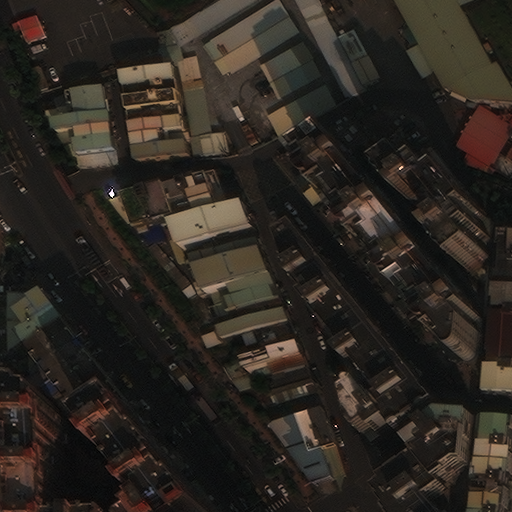

In [132]:
i =Image.open('/dccstor/terratorch/users/rkie/data/xview/train_images_cropped/1346_1_2.tif').convert("RGB")
i

In [80]:
i.size

(512, 512)

In [110]:
!ls /dccstor/terratorch/users/rkie/data/xview/train_images

100.tif   1346.tif  1695.tif  2020.tif	2455.tif  379.tif  658.tif
102.tif   1351.tif  1701.tif  2021.tif	2459.tif  380.tif  659.tif
1036.tif  1353.tif  1702.tif  2026.tif	2460.tif  381.tif  665.tif
1037.tif  1357.tif  1703.tif  2029.tif	2462.tif  382.tif  669.tif
1042.tif  1361.tif  1707.tif  2031.tif	2468.tif  386.tif  670.tif
1044.tif  1362.tif  1739.tif  2032.tif	2469.tif  389.tif  671.tif
1046.tif  1364.tif  1740.tif  2036.tif	2470.tif  38.tif   672.tif
1048.tif  136.tif   1741.tif  203.tif	2471.tif  393.tif  674.tif
1049.tif  1372.tif  1743.tif  2042.tif	2472.tif  394.tif  680.tif
104.tif   1374.tif  1749.tif  2044.tif	2475.tif  399.tif  682.tif
1050.tif  1378.tif  1767.tif  2053.tif	2482.tif  401.tif  684.tif
1051.tif  1379.tif  1768.tif  2055.tif	2484.tif  407.tif  692.tif
1052.tif  1384.tif  1769.tif  2062.tif	2485.tif  40.tif   694.tif
1053.tif  1385.tif  1770.tif  2064.tif	2486.tif  414.tif  69.tif
1056.tif  1397.tif  1772.tif  2072.tif	2487.tif  415.tif  708.tif
1058.tif  13

In [ ]:
""" with open('/dccstor/terratorch/users/rkie/data/xview/xView_train.geojson') as f:
    anns = json.load(f) """

In [ ]:
""" runs = 10


for idx, feat in enumerate(anns['features']):
    obj_id = idx
    image_id = feat['properties']['image_id']
    print(image_id)

    img_path = os.path.join('/dccstor/terratorch/users/rkie/data/xview/', f"{image_id}")
    if not os.path.exists(img_path):
        print(f'{img_path} skipped because it was not found')
        continue
    
    img = Image.open(img_path).convert("RGB")
    img = img.crop(0,0,3072,3072)

    print(feat['properties']['bounds_imcoords'])
    print(feat['properties']['type_id'])
    runs = runs - 1 
    if runs < 1:
        break
 """

In [11]:
import os
import logging
from torch.utils.data import DataLoader
from lightning.pytorch import LightningDataModule
from torchvision import transforms
import torch
import torch.nn.functional as F
from torchvision.models.detection.transform import GeneralizedRCNNTransform




class XviewDataModule(LightningDataModule):

    def __init__(self, data_dir, ann_file, batch_size=8, num_workers=4, img_transform=None):
        super().__init__()
        self.data_dir = data_dir
        self.ann_file = ann_file
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.img_transform = img_transform or transforms.ToTensor()

    def setup(self, stage=None):
        if not os.path.exists(self.data_dir):
            raise FileNotFoundError(f"Data directory not found: {self.data_dir}")
        if not os.path.isfile(self.ann_file):
            raise FileNotFoundError(f"Annotation file not found: {self.ann_file}")

        self.xv_dataset = XviewDataset(
            root=self.data_dir,
            annFile=self.ann_file,
            transform=self.img_transform
        )

    def detection_collate(self, batch):
        """
        Collate function for TorchVision object detection datasets.
        Returns:
            images: Tensor [B,C,Hmax,Wmax]
            targets: List[dict], each dict has 'boxes' [N,4] and 'labels' [N]
        """
        images = [item[0] for item in batch]
        annots_batch = [item[1] for item in batch]

        """         # pad images to max H,W
        max_h = max(img.shape[1] for img in images)
        max_w = max(img.shape[2] for img in images)
        padded_images = []
        for img in images:
            c, h, w = img.shape
            pad = (0, max_w - w, 0, max_h - h)  # left, right, top, bottom
            padded_images.append(F.pad(img, pad, value=0.0))
        images_tensor = torch.stack(padded_images, dim=0)  # [B,C,Hmax,Wmax] """

        images_tensor = torch.stack(images, dim=0)

        # prepare targets
        targets = []
        #for annots in annots_batch:
        #    boxes = torch.tensor([
        #        list(map(float, obj['bbox'].split(','))) for obj in annots
        #    ], dtype=torch.float32) if annots else torch.zeros((0, 4), dtype=torch.float32)
#
 #           labels = torch.tensor([
  #              int(obj['type_id']) for obj in annots
   #         ], dtype=torch.int64) if annots else torch.zeros((0,), dtype=torch.int64)
#
 #           targets.append({
  #              'boxes': boxes,
   #             'labels': labels
    #        })


        return { 'image': images_tensor, 'boxes': [d["boxes"] for d in annots_batch], 'labels': [d["labels"] for d in annots_batch] }



    def train_dataloader(self):
        return DataLoader(
            self.xv_dataset,
            batch_size=self.batch_size,
            shuffle=True,
            num_workers=self.num_workers,
            collate_fn=self.detection_collate,
        )

    def val_dataloader(self):
        return DataLoader(
            self.xv_dataset,
            batch_size=self.batch_size,
            shuffle=False,
            num_workers=self.num_workers,
            collate_fn=self.detection_collate,
        )

    def test_dataloader(self):
        return DataLoader(
            self.xv_dataset,
            batch_size=self.batch_size,
            shuffle=False,
            num_workers=self.num_workers,
            collate_fn=self.detection_collate,
        )


In [3]:
import time

start_total = time.time()

t0 = time.time()
import logging
print("logging import:", time.time() - t0, "seconds")

t0 = time.time()
from terratorch.tasks import ObjectDetectionTask
print("ObjectDetectionTask import:", time.time() - t0, "seconds")

t0 = time.time()
#from terratorch.datamodules.xview import XviewDataModule
print("XviewDataModule import:", time.time() - t0, "seconds")

t0 = time.time()
from lightning.pytorch import Trainer
print("Trainer import:", time.time() - t0, "seconds")

t0 = time.time()
from torchvision import transforms
print("torchvision.transforms import:", time.time() - t0, "seconds")

print("Total import time:", time.time() - start_total, "seconds")

import torch

logging import: 3.361701965332031e-05 seconds
ObjectDetectionTask import: 35.6165771484375 seconds
XviewDataModule import: 4.2438507080078125e-05 seconds
Trainer import: 4.839897155761719e-05 seconds
torchvision.transforms import: 3.886222839355469e-05 seconds
Total import time: 35.617154359817505 seconds


In [ ]:
#!wget https://raw.githubusercontent.com/akihironitta/xView-PyTorch/refs/heads/master/datasets.py
#!mv datasets.py ../../terratorch/datasets/xview.py


In [12]:
img_transform = transforms.Compose([
    transforms.Resize((3072, 3072)), 
    transforms.ToTensor()
])

dm = XviewDataModule(data_dir = '/dccstor/terratorch/users/rkie/data/xview/train_images_cropped_1346', 
                     ann_file = '/dccstor/terratorch/users/rkie/data/xview/xView_train.geojson', 
                     img_transform = img_transform,
                     batch_size = 1,
)

In [13]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# --- 1. Create dummy data to simulate your input ---
# List of image tensors (e.g., 3 images, each 256x256 with 3 channels)
# Images are in (C, H, W) format, which is common in PyTorch
images = [torch.rand(3, 256, 256) for _ in range(3)]

# List of bounding box tensors for each image
# Each tensor is of shape (N, 4) where N is the number of boxes
# The format is [x_min, y_min, x_max, y_max]
boxes = [
    torch.tensor([[50, 50, 150, 150], [180, 20, 240, 80]]),
    torch.tensor([[10, 10, 100, 200]]),
    torch.tensor([[100, 100, 200, 200], [20, 180, 80, 240], [150, 50, 220, 120]])
]

# --- 2. Plotting function ---
def plot_images_with_boxes(image_list, box_list):
    """
    Plots a list of images with their corresponding bounding boxes.
    
    Args:
        image_list (list): A list of torch.Tensor images in (C, H, W) format.
        box_list (list): A list of torch.Tensor boxes, where each tensor is of shape (N, 4)
                         in [x_min, y_min, x_max, y_max] format.
    """
    if len(image_list) != len(box_list):
        raise ValueError("Image list and box list must have the same length.")

    # Determine a suitable grid for plotting
    num_images = len(image_list)
    cols = min(4, num_images)
    rows = (num_images + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))
    axes = axes.flatten() if num_images > 1 else [axes]

    for i in range(num_images):
        image_tensor = image_list[i]
        box_tensor = box_list[i]

        # Convert image tensor from (C, H, W) to (H, W, C) for plotting
        image_np = image_tensor.permute(1, 2, 0).numpy()
        
        # Plot the image
        ax = axes[i]
        ax.imshow(image_np)
        
        # Iterate over bounding boxes and draw them
        for box in box_tensor:
            x_min, y_min, x_max, y_max = box.numpy()
            
            # Create a rectangle patch
            rect = patches.Rectangle(
                (x_min, y_min),  # (x, y) of the bottom-left corner
                x_max - x_min,    # width
                y_max - y_min,    # height
                linewidth=2,
                edgecolor='r',
                facecolor='none'
            )
            
            # Add the rectangle to the axes
            ax.add_patch(rect)
        
        ax.set_title(f"Image {i+1}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()



Getting item: 35Getting item: 32Getting item: 7Getting item: 34



opening image : 1346_6_5.tifopening image : 1346_2_2.tifopening image : 1346_6_6.tifopening image : 1346_6_3.tif



Getting item: 17Getting item: 19

opening image : 1346_3_6.tifopening image : 1346_4_2.tif

Getting item: 26Getting item: 18

opening image : 1346_5_3.tifopening image : 1346_4_1.tif

Getting item: 1
opening image : 1346_1_2.tif


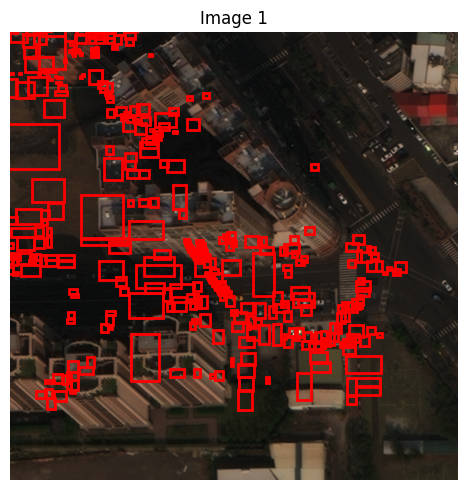

Getting item: 31
opening image : 1346_6_2.tif


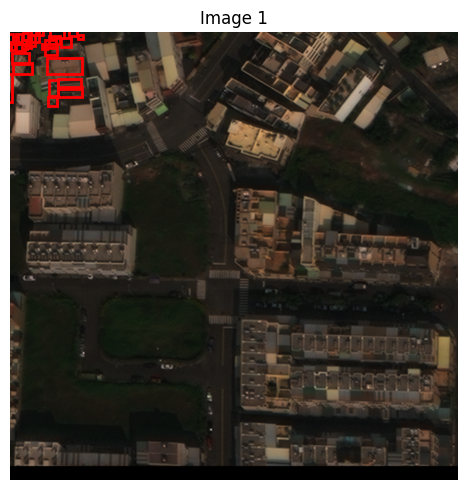

Getting item: 13
opening image : 1346_3_2.tif


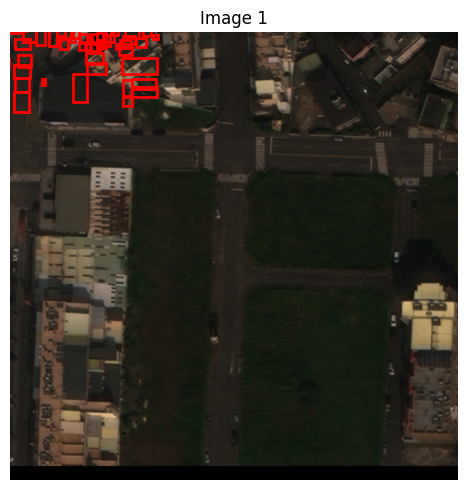

Getting item: 20
opening image : 1346_4_3.tif


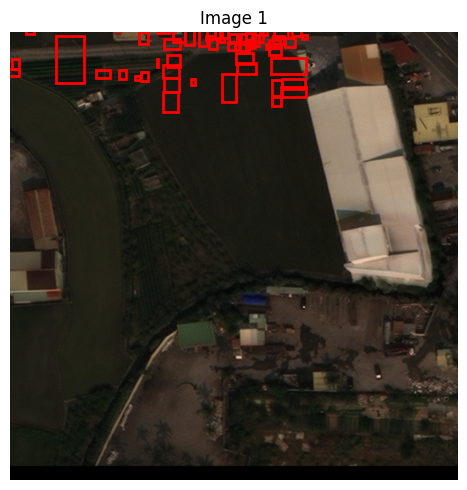

Getting item: 9
opening image : 1346_2_4.tif


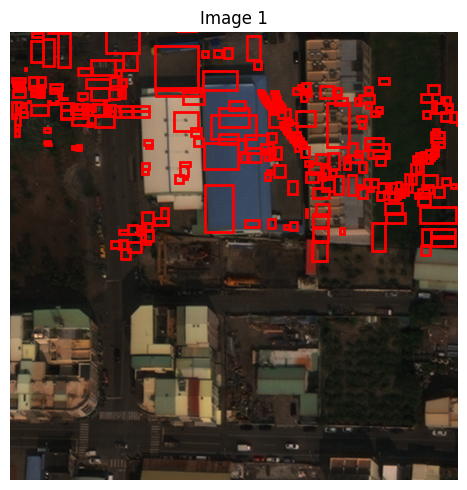

Getting item: 21
opening image : 1346_4_4.tif


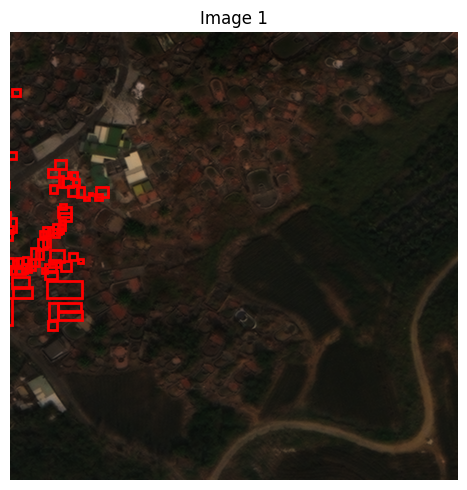

Getting item: 27
opening image : 1346_5_4.tif


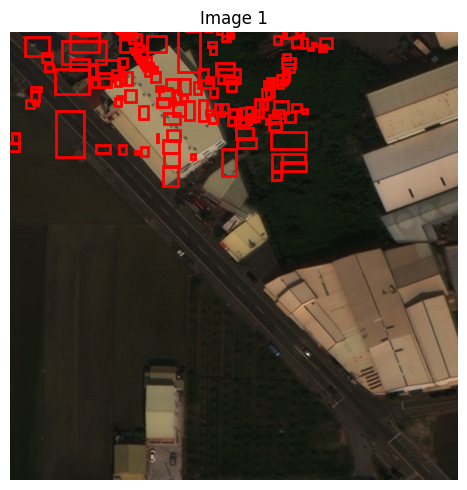

Getting item: 11
opening image : 1346_2_6.tif


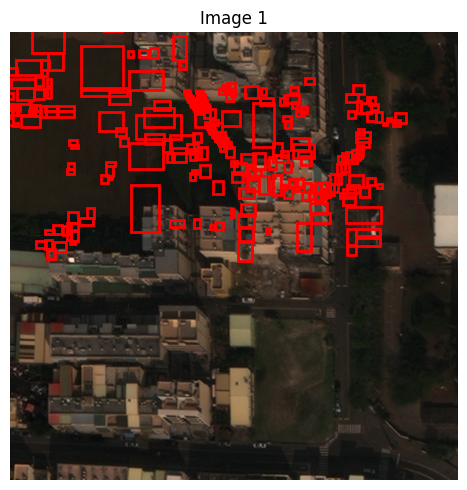

Getting item: 4
opening image : 1346_1_5.tif


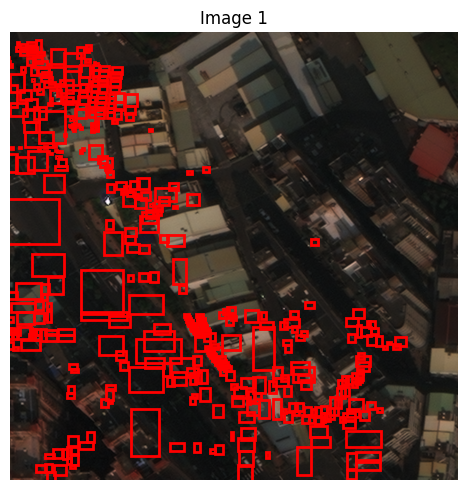

Getting item: 8
opening image : 1346_2_3.tif


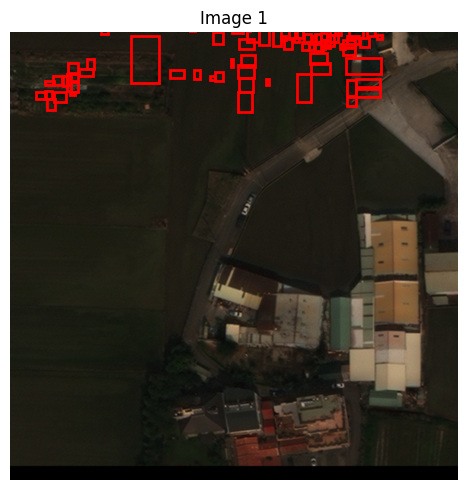

Getting item: 6
opening image : 1346_2_1.tif


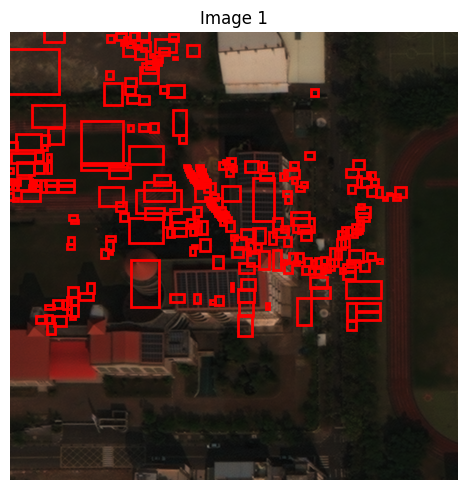

Getting item: 24
opening image : 1346_5_1.tif


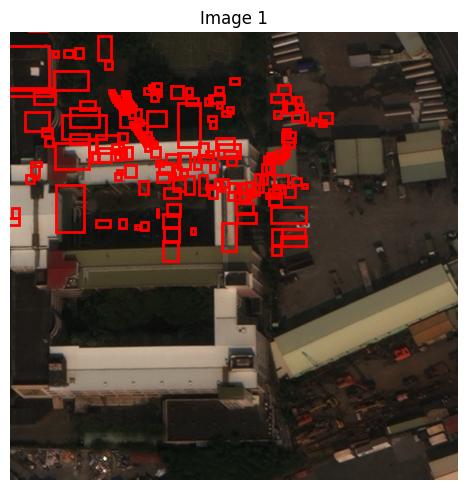

Getting item: 30
opening image : 1346_6_1.tif


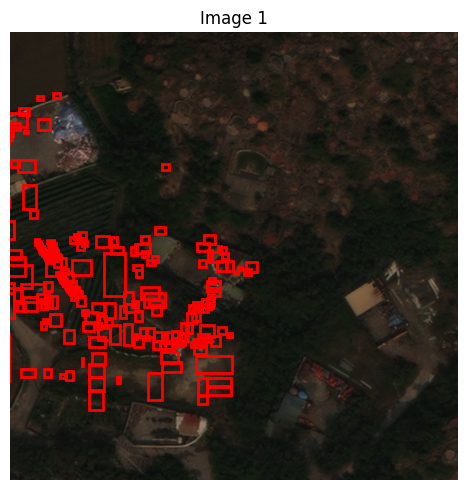

Getting item: 5
opening image : 1346_1_6.tif


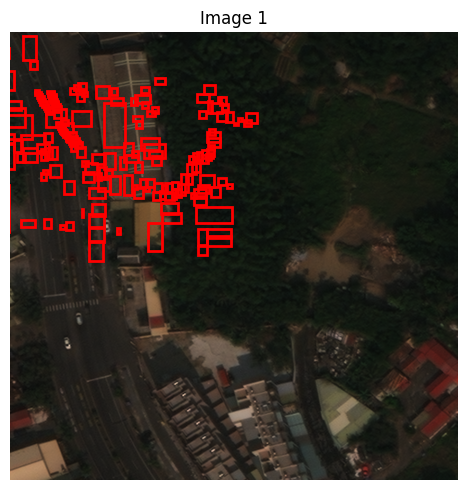

Getting item: 12
opening image : 1346_3_1.tif


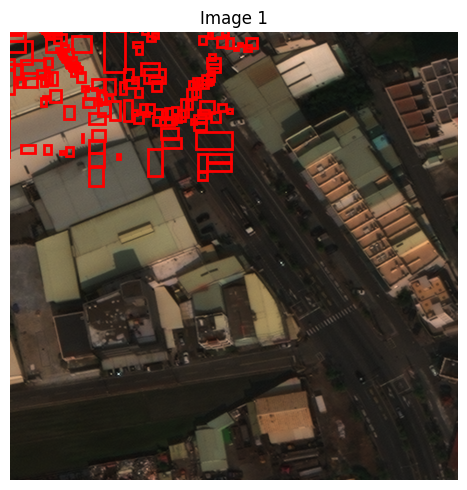

Getting item: 29
opening image : 1346_5_6.tif


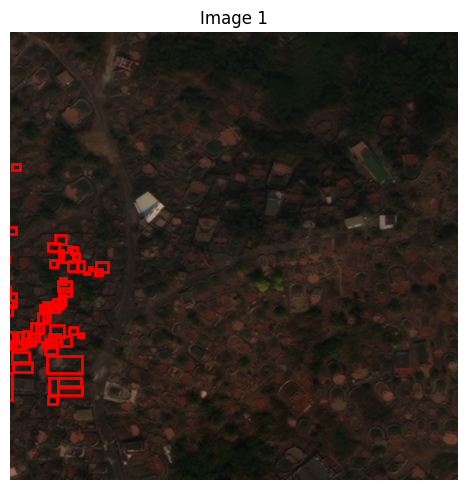

Getting item: 33
opening image : 1346_6_4.tif


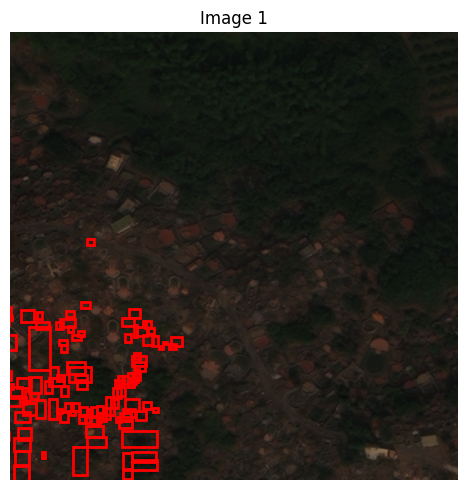

Getting item: 28
opening image : 1346_5_5.tif


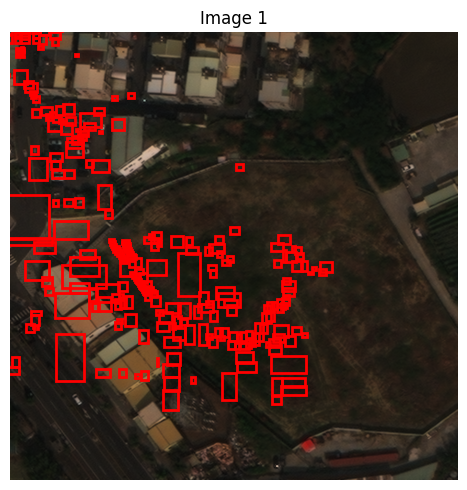

Getting item: 10
opening image : 1346_2_5.tif


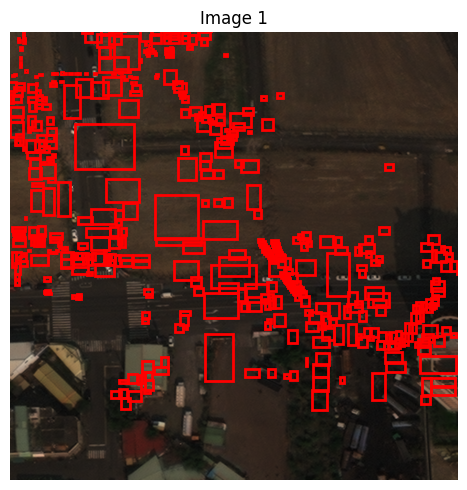

Getting item: 14
opening image : 1346_3_3.tif


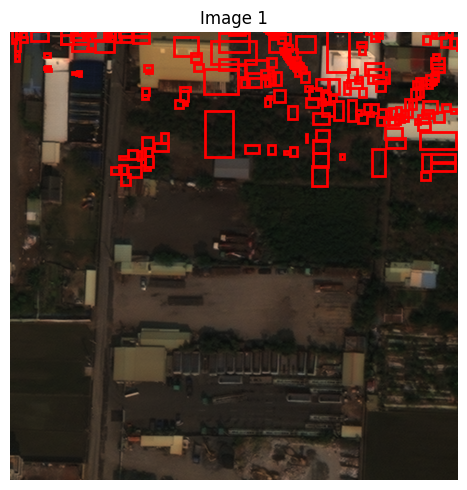

Getting item: 3
opening image : 1346_1_4.tif


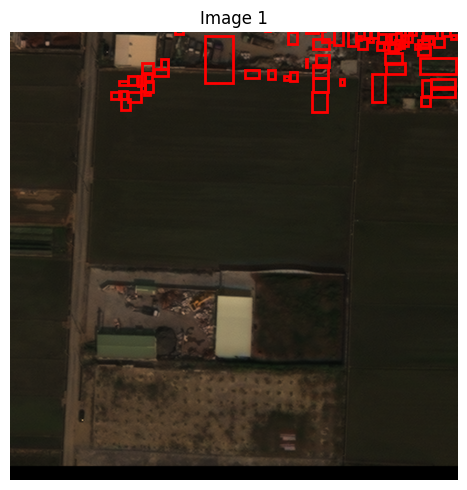

Getting item: 16
opening image : 1346_3_5.tif


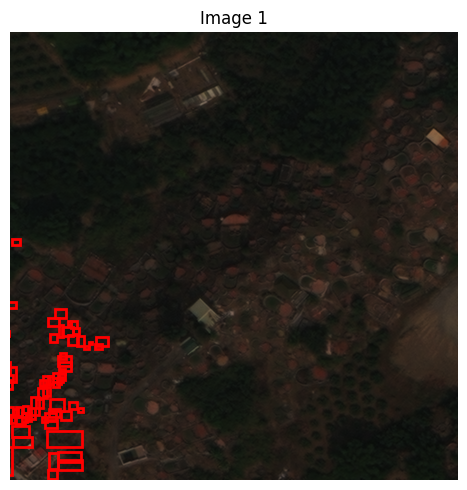

Getting item: 2
opening image : 1346_1_3.tif


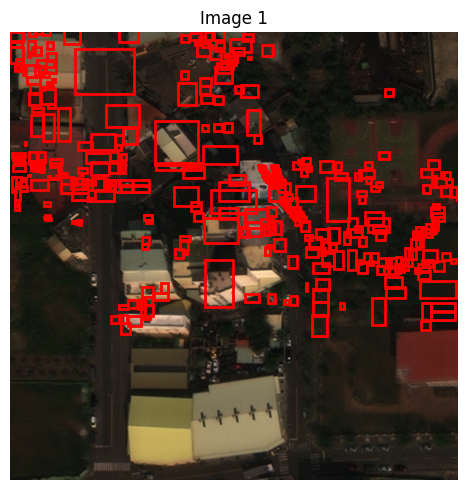

Getting item: 23
opening image : 1346_4_6.tif


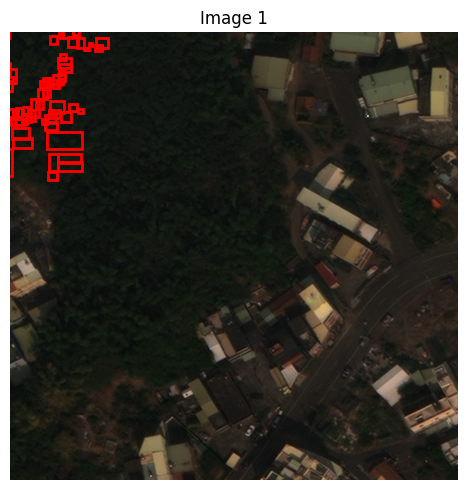

Getting item: 0
opening image : 1346_1_1.tif


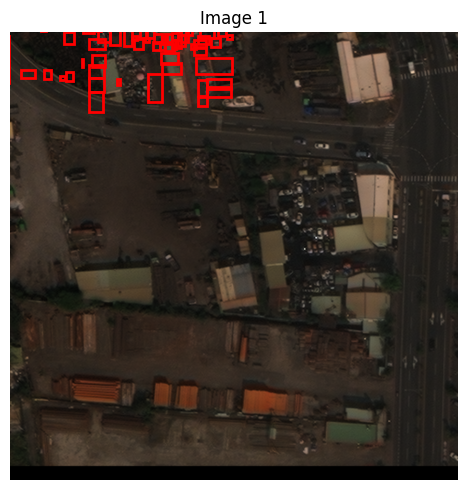

Getting item: 15
opening image : 1346_3_4.tif


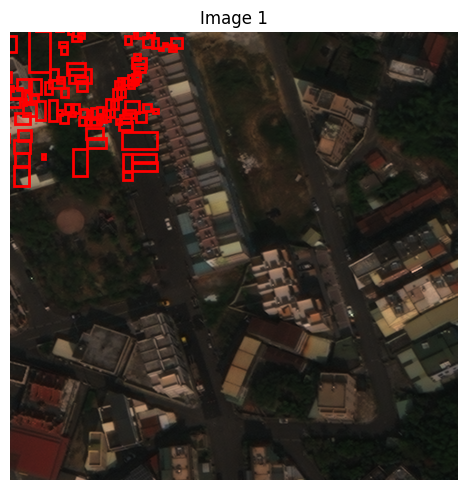

Getting item: 22
opening image : 1346_4_5.tif


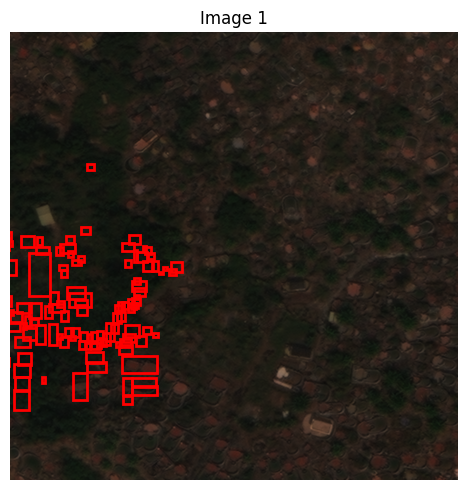

Getting item: 25
opening image : 1346_5_2.tif


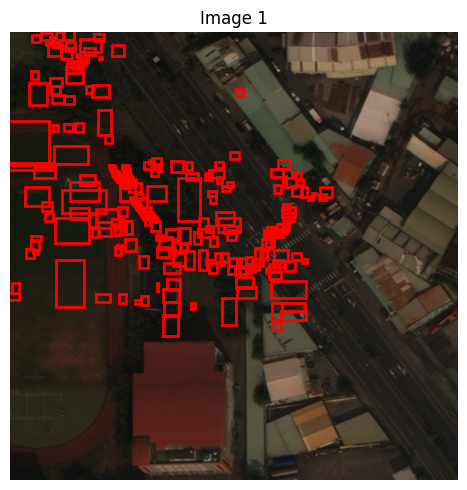

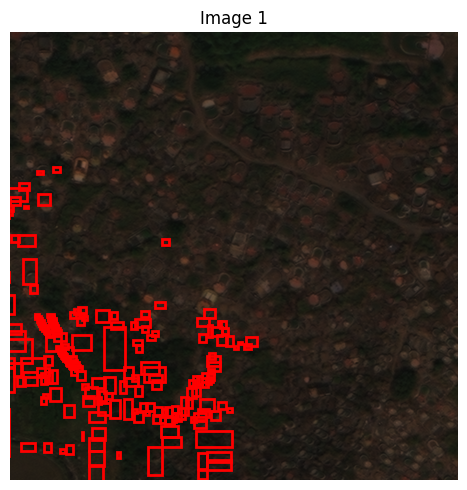

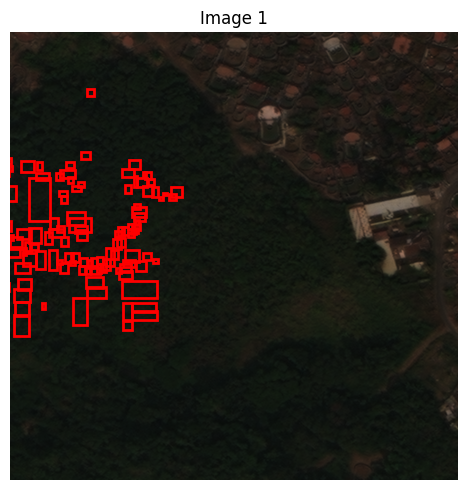

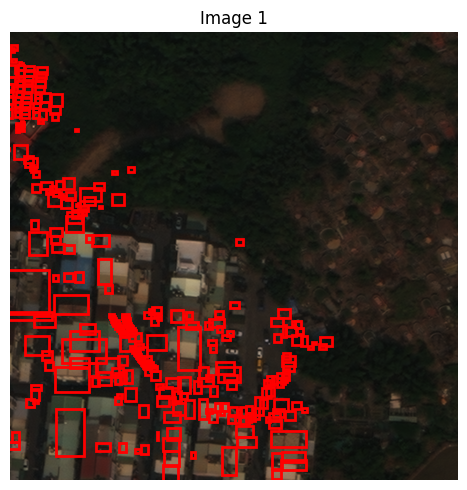

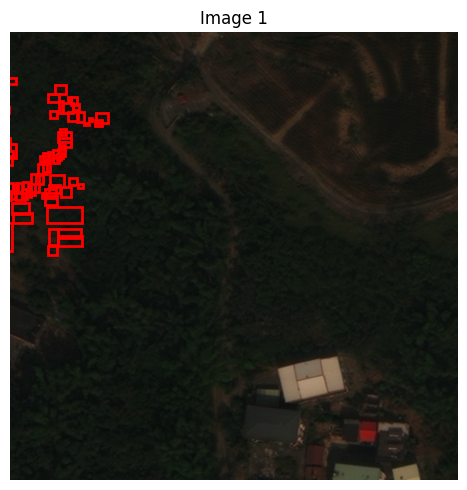

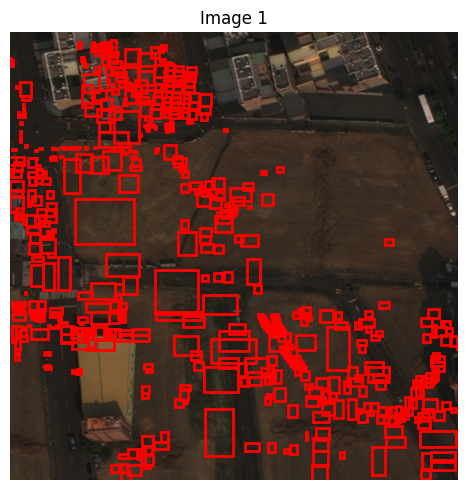

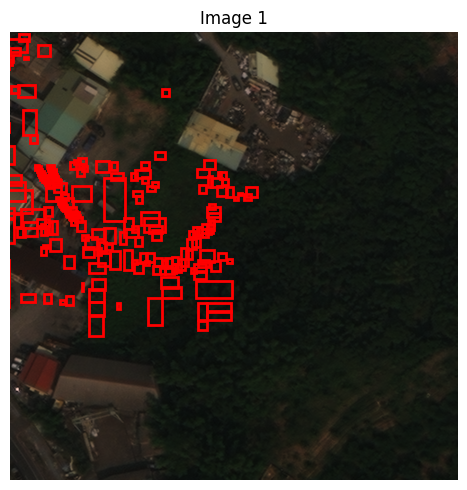

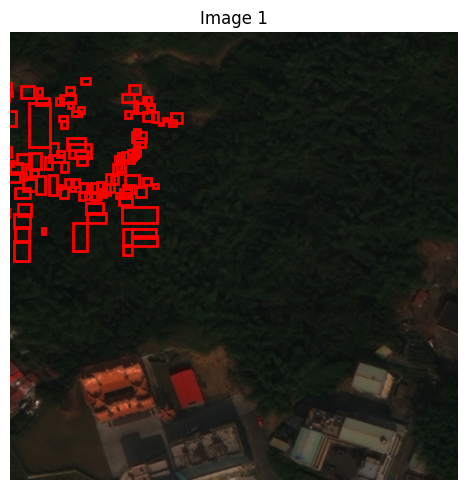

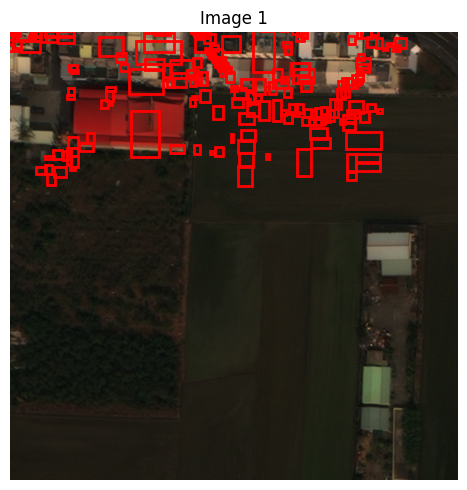

In [14]:
import torch
import torchvision
import matplotlib.pyplot as plt
import numpy as np
import random
from torchvision.datasets import VOCSegmentation # Example dataset
dm.setup()
train_loader = dm.train_dataloader()
num_to_plot = 0
for i, batch in enumerate(train_loader):
    plot_images_with_boxes(batch['image'], batch['boxes'])



In [9]:
(25+36)%36

25

import json
with open('/dccstor/terratorch/users/rkie/data/xview/xView_train.geojson') as f:
    anns = json.load(f)

s = set()
for i, f in enumerate(anns['features']):
    s.add(f['properties']['image_id'])

for setitem in s:
    print(setitem)

In [ ]:
#dm.setup()

#dl = dm.train_dataloader()


In [ ]:
#item = next(iter(dl))

In [ ]:
#item

In [ ]:
#item['boxes_labels']

In [ ]:
#type(images)


In [ ]:
import os
os.environ["HF_TOKEN"] = ""


In [ ]:
model_args = {
    "framework": "faster-rcnn",
    "backbone": "terramind_v1_tiny",
    "backbone_pretrained": True,
    "num_classes": 100,
    "framework_min_size": 512,
    "framework_max_size": 512,
    "backbone_modalities": ["RGB"],
    "in_channels": 3,
    "necks": [
        {
            "name": "SelectIndices",
            "indices": [2, 5, 8, 11]
        },
        {
            "name": "ReshapeTokensToImage",
            "remove_cls_token": False
        },
        {
            "name": "LearnedInterpolateToPyramidal"
        },
        {
            "name": "FeaturePyramidNetworkNeck"
        }
    ]
}
m = ObjectDetectionTask(model_factory='ObjectDetectionModelFactory', model_args=model_args)

In [ ]:
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import ModelCheckpoint
import torch

checkpoint_cb = ModelCheckpoint(
    dirpath="checkpoints",
    filename="odet-{epoch:02d}-{val_loss:.2f}",
    save_last=True,
)

In [ ]:
trainer = Trainer(
    devices=1,
    max_epochs=100,
    default_root_dir='output',
    log_every_n_steps=1,
    check_val_every_n_epoch=1,
    callbacks=[checkpoint_cb],
    logger=True,
)

In [ ]:
trainer.fit(model=m, datamodule=dm)  

In [ ]:
model = ObjectDetectionTask.load_from_checkpoint("./checkpoints/last-v3.ckpt")

In [ ]:
!wget https://challenge.xviewdataset.org/static/example_unlabeled.jpg

In [ ]:
files = os.listdir('../../../../data/xview/train_images/')

In [ ]:
import torch
from torchvision.transforms import functional as F
from matplotlib import pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from terratorch.models.object_detection_model_factory import ModelOutputObjectDetection
import math

def run_tiled_inference(model, img, tile_size=504, pad=21, score_thresh=0.5, device="cpu", align_to_multiple=21):
    """Run inference on large images using tiling approach with proper alignment"""
    model.eval()
    
    img_tensor = F.to_tensor(img).to(device)
    _, H_padded, W_padded = img_tensor.shape

    all_boxes, all_scores, all_labels = [], [], []

    # Calculate steps ensuring tiles overlap properly with padding
    y_steps = list(range(0, 3072, 512))
    x_steps = list(range(0, 3072, 512))

    for y in y_steps:
        for x in x_steps:
           
            # Extract tile
            tile_tensor = img_tensor[:, y:y+512, x:x+512].unsqueeze(0)

            with torch.no_grad():
                output: ModelOutputObjectDetection = model(tile_tensor)

            out_dict = output.output[0] if isinstance(output.output, list) else output.output
            boxes = out_dict.get("boxes", torch.empty(0, 4, device=device))
            scores = out_dict.get("scores", torch.empty(0, device=device))
            labels = out_dict.get("labels", torch.empty(0, dtype=torch.long, device=device))

            if boxes.numel() > 0:
                # Adjust box coordinates back to the original image space
                boxes[:, [0, 2]] += x1
                boxes[:, [1, 3]] += y1

            all_boxes.append(boxes)
            all_scores.append(scores)
            all_labels.append(labels)

    if all_boxes:
        all_boxes = torch.cat(all_boxes)
        all_scores = torch.cat(all_scores)
        all_labels = torch.cat(all_labels)
    else:
        all_boxes = torch.empty(0, 4)
        all_scores = torch.empty(0)
        all_labels = torch.empty(0, dtype=torch.long)

    keep = all_scores >= score_thresh
    filtered_boxes = all_boxes[keep]
    filtered_scores = all_scores[keep]
    filtered_labels = all_labels[keep]
    
    return filtered_boxes, filtered_scores, filtered_labels

# Load and process image
image_name = files.pop()
img_path = f"../../../../data/xview/train_images/{image_name}"
img = Image.open(img_path).convert("RGB")
img = img.crop((0, 0, 3072, 3072))

# Run inference
boxes, scores, labels = run_tiled_inference(
    model, 
    img, 
    tile_size=512,
    pad=6,
    device="cpu"
)

# Print detected boxes
print("\nDetected Objects:")
print("----------------")
for i, (box, score, label) in enumerate(zip(boxes, scores, labels)):
    x1, y1, x2, y2 = box.tolist()
    print(f"Object {i+1}:")
    print(f"  Label: {label.item()}")
    print(f"  Confidence: {score.item():.4f}")
    print(f"  Bounding Box: [{x1:.1f}, {y1:.1f}, {x2:.1f}, {y2:.1f}]")
    print(f"  Width: {x2-x1:.1f}px, Height: {y2-y1:.1f}px")
    print("----------------")

# Visualization
fig, ax = plt.subplots(1, figsize=(12, 12))
ax.imshow(img)
for box, score, label in zip(boxes, scores, labels):
    x1, y1, x2, y2 = box.tolist()
    rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, edgecolor='r', facecolor='none')
    ax.add_patch(rect)
    ax.text(x1, y1-5, f"{label.item()}:{score:.2f}", color='yellow', fontsize=12)
plt.title(f"Detected Objects: {len(boxes)}", fontsize=14)
plt.show()

In [ ]:
img_path = "../../../../data/xview/train_images/10.tif"
img = Image.open(img_path).convert("RGB")

In [ ]:
cropped_img = img.crop((0, 0, 3072, 3072))

In [ ]:
cropped_img.size

In [ ]:
from terratorch.models.object_detection_model_factory import ModelOutputObjectDetection
import torch
from torch import Tensor

class ONNXWrapper(torch.nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, *args, **kwargs):
        out = self.model(*args, **kwargs)

        # --- Handle ModelOutputObjectDetection ---
        if isinstance(out, ModelOutputObjectDetection):
            if isinstance(out.output, dict):
                # Single image
                boxes = out.output.get("boxes", torch.empty(0, 4))
                scores = out.output.get("scores", torch.empty(0))
                labels = out.output.get("labels", torch.empty(0, dtype=torch.long))
                return boxes, scores, labels

            elif isinstance(out.output, list):
                # Batch: flatten all boxes/scores/labels into single tensors
                all_boxes, all_scores, all_labels = [], [], []
                for item in out.output:
                    all_boxes.append(item.get("boxes", torch.empty(0, 4)))
                    all_scores.append(item.get("scores", torch.empty(0)))
                    all_labels.append(item.get("labels", torch.empty(0, dtype=torch.long)))

                boxes = torch.cat(all_boxes, dim=0) if all_boxes else torch.empty(0, 4)
                scores = torch.cat(all_scores, dim=0) if all_scores else torch.empty(0)
                labels = torch.cat(all_labels, dim=0) if all_labels else torch.empty(0, dtype=torch.long)
                return boxes, scores, labels

        # --- If it's already a tensor ---
        if isinstance(out, Tensor):
            return out

        # --- Fallback ---
        raise TypeError(f"Unsupported model output type: {type(out)}")



In [ ]:
onnx_model = ONNXWrapper(model)

In [ ]:
onnx_model.eval()


In [ ]:

dummy_input = torch.randn(1, 3, 512,512)  # batch size 1, 10 features


In [ ]:
torch.onnx.export(
    onnx_model,              # the PyTorch model
    dummy_input,              # dummy input
    "model.onnx",             # output file     
    export_params=True,       # store trained weights
    opset_version=17,         # recommended ONNX opset
    do_constant_folding=True, # optimize constants
    input_names=['input'],    # model input name
    output_names=['output'],  # model output name
    dynamic_axes={'input': {0: 'batch_size'}, 'output': {0: 'batch_size'}}  # allow variable batch size
)

In [ ]:
print(sample[0])  


In [ ]:
print(sample[1])  


In [ ]:
import onnx
import onnxruntime as ort
import numpy as np

# Path to your ONNX model
onnx_path = "model.onnx"

# --- Load the model to inspect input/output metadata ---
model = onnx.load(onnx_path)
onnx.checker.check_model(model)

# Create inference session
session = ort.InferenceSession(onnx_path)

# Get input metadata
input_meta = session.get_inputs()[0]
input_name = input_meta.name
input_shape = input_meta.shape  # may have symbolic dimensions

# Replace symbolic dimensions with actual values where possible
resolved_shape = [
    dim if isinstance(dim, int) else 1 for dim in input_shape
]

# If the model expects fixed spatial dimensions, use them
# Example: input_shape could be ['batch_size', 3, 512, 512]
height = resolved_shape[2]
width = resolved_shape[3]

print(f"Input name: {input_name}")
print(f"Expected input shape: {input_shape} → resolved: {resolved_shape}")

# Create a dummy input with the correct shape
dummy_input = np.random.randn(
    resolved_shape[0],  # batch
    resolved_shape[1],  # channels
    height,
    width
).astype(np.float32)

# Run inference
outputs = session.run(None, {input_name: dummy_input})

# Print output names and shapes
for name, arr in zip([o.name for o in session.get_outputs()], outputs):
    print(f"Runtime output '{name}': shape={arr.shape}, dtype={arr.dtype}")
